## Load data into AnnData object

In [1]:
import scanpy as sc
import anndata as ad
import scanpy.external as sce
import pandas as pd
import matplotlib.pyplot as plt

adata = ad.read_h5ad('../../Data/batch_integration_1-3_cd4_t_subset_batch1.h5ad')

In [2]:
sc.set_figure_params(dpi=50, facecolor="white") 


In [3]:
print(adata.obs["pica_id"].value_counts())
adata

pica_id
PICA0001    2407
PICA0007    1879
PICA0006    1633
PICA0003    1216
PICA0004    1214
PICA0002    1022
PICA0005     688
Name: count, dtype: int64


AnnData object with n_obs × n_vars = 10059 × 38606
    obs: 'status', 'assignment', 'pica_id', 'pool_id', 'sequencing_batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'status_manual', 'cell_type', 'status_manual_01_b_subset', 'broad_cell_type', 'cell_type_01_b_cell', 'cell_type_01_b_cell_corrected', 'cell_type_02_t_cell_broad', 'cell_type_03_t_cell_subtype', 'cell_type_04_myeloid_subset'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_

## Define Mt, Rb, Hb genes and Calculate QC metrics

## Visualize QC metrics

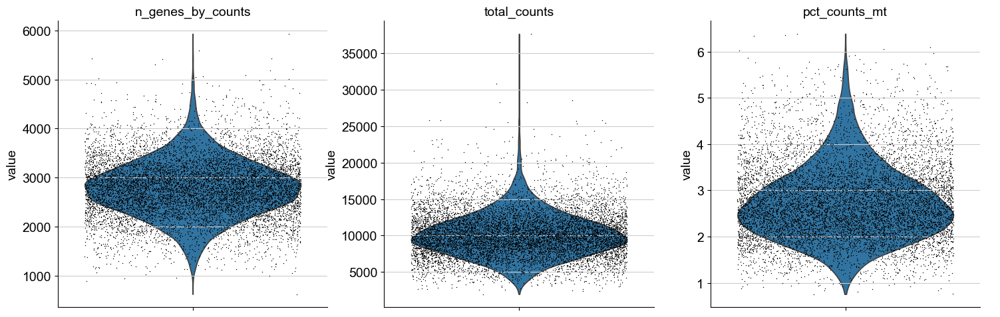

In [4]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True)

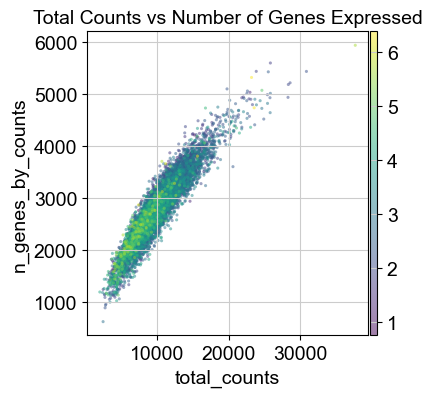

In [5]:
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color='pct_counts_mt', title='Total Counts vs Number of Genes Expressed', alpha=0.5, size=20)

## Filter to keep good quality cells/genes if needed
Remove cells with less than 100 genes and remove genes not present in more than 3 cells
Remove cells that has more than 5% of mt expression

## Doublet detection
Scrublet
output: doublet_score and predicted_doublet in .obs
Use score during clustering to filter clusters with high doublet scores

## Normalization

In [6]:
adata.layers['counts'] = adata.X.copy()  # Store raw counts in a separate layer

In [7]:
sc.pp.normalize_total(adata)  # default count to 1e4
sc.pp.log1p(adata)

## Feature selection
Reduce dimensionality of dataset to only include informative genes

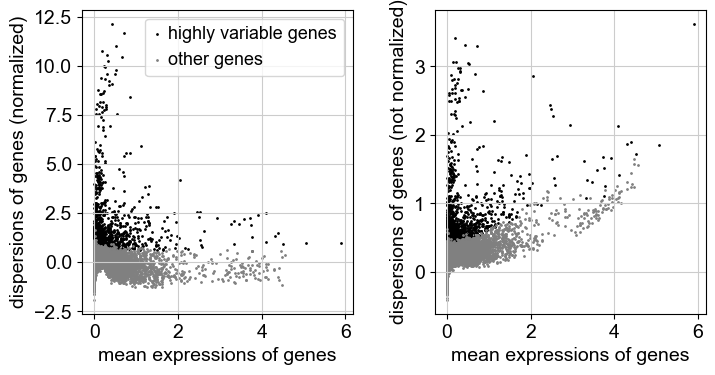

In [8]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000, batch_key='pica_id')
sc.pl.highly_variable_genes(adata)

In [9]:
print(adata.var.highly_variable.sum())


2000


## Dimensionality reduction
How many PCs to consider to compute neighbourhood relation of cells
Used in clustering function leiden()

In [10]:
sc.tl.pca(adata)

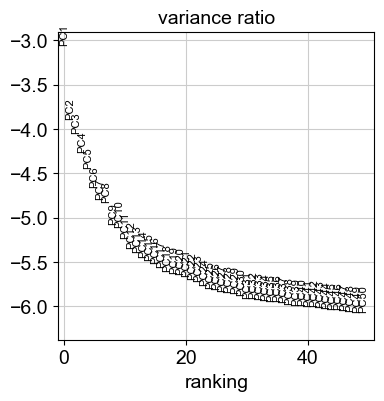

In [11]:
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

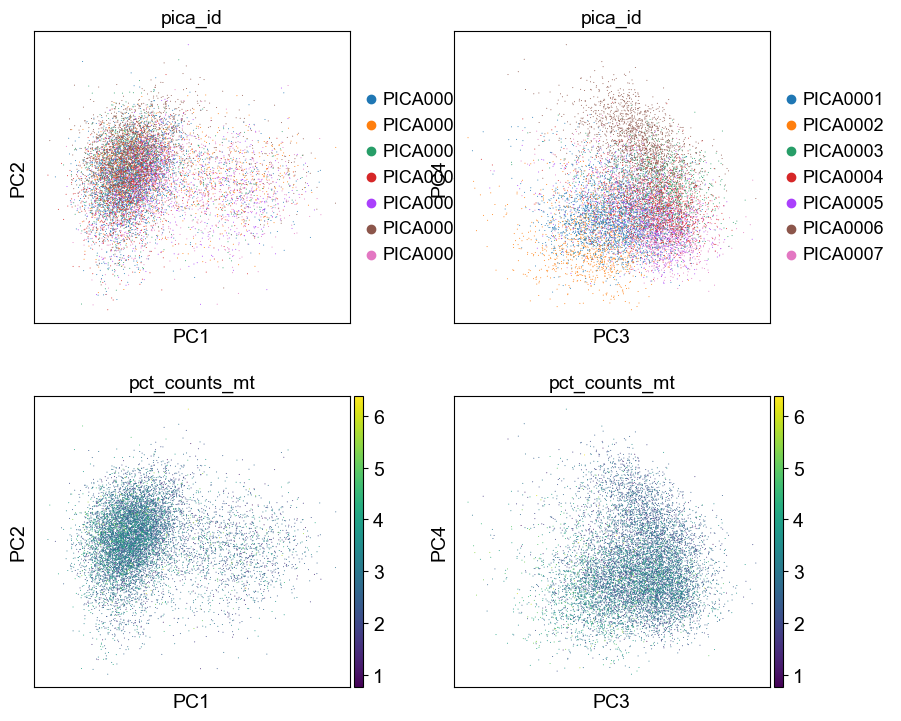

In [12]:
# Check PCA results for undesired technical artifacts like batch effects or mitochondrial stress
sc.pl.pca(
    adata,
    color=["pica_id", "pica_id", "pct_counts_mt", "pct_counts_mt"],
    dimensions=[(0, 1), (2, 3), (0, 1), (2, 3)],
    ncols=2,
    size=2,
)

## Nearest neighbour graph construction and visualization
using PCA results

In [13]:
sc.pp.neighbors(adata)

In [14]:
sc.tl.umap(adata)

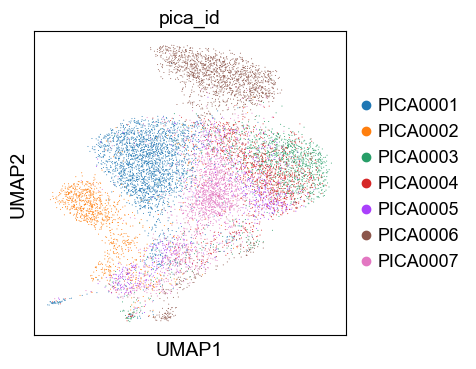

In [15]:
sc.pl.umap(
    adata,
    color="pica_id",
    # Setting a smaller point size to get prevent overlap
    size=2,
)

## Clustering
Leiden graph-clustering method (community detection based on optimizing modularit) like in Seurat

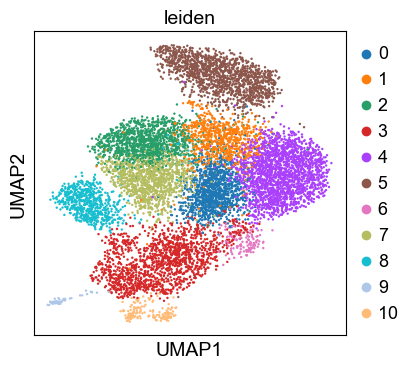

In [16]:

sc.tl.leiden(adata, flavor="igraph", n_iterations=2)
sc.pl.umap(adata, color=["leiden"])

saving figure to file figures/umapbatch1_leiden_pica_id_umap.png


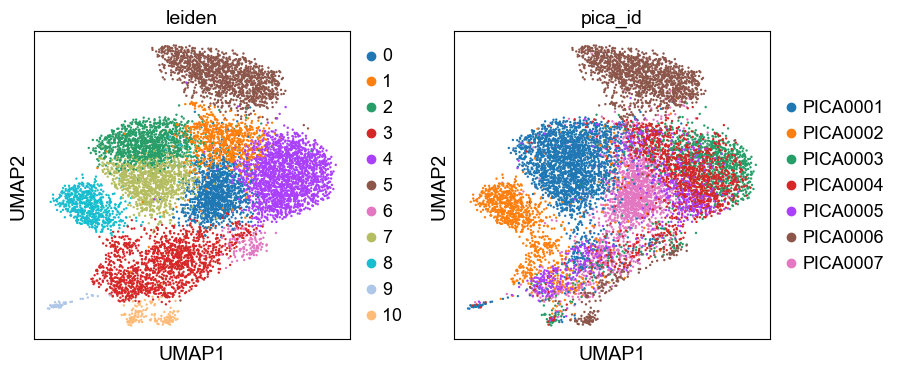

In [17]:
sc.pl.umap(adata, color = ['leiden','pica_id'], save='batch1_leiden_pica_id_umap.png')

Batch integration?

2025-08-15 11:50:22,249 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-08-15 11:50:22,940 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-08-15 11:50:22,969 - harmonypy - INFO - Iteration 1 of 10
2025-08-15 11:50:24,303 - harmonypy - INFO - Iteration 2 of 10
2025-08-15 11:50:25,223 - harmonypy - INFO - Iteration 3 of 10
2025-08-15 11:50:26,102 - harmonypy - INFO - Converged after 3 iterations
/var/folders/xb/gpl6jzb15493fwndpjblxyc40000gn/T/ipykernel_95119/3916616472.py:7: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata)
saving figure to file figures/umapbatch1_leiden_pica_id_IntegratedUmap.png


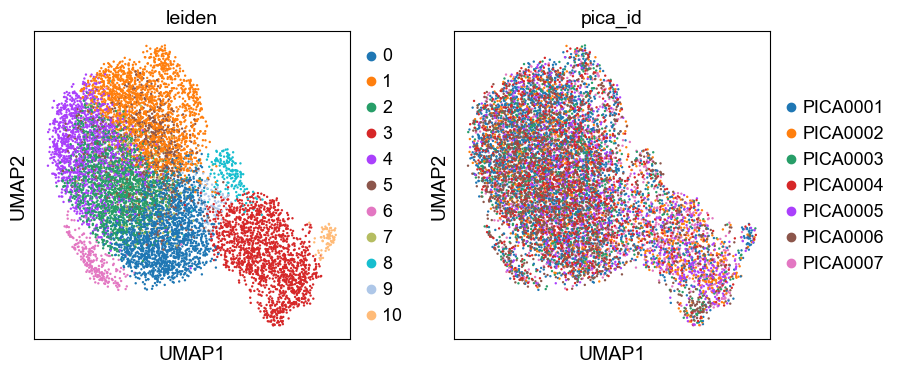

In [18]:

adata_uncorrected = adata.copy()

sce.pp.harmony_integrate(adata, key='pica_id')

sc.pp.neighbors(adata, use_rep='X_pca_harmony')
sc.tl.umap(adata)  
sc.tl.leiden(adata)

sc.pl.umap(adata, color = ['leiden','pica_id'], save='batch1_leiden_pica_id_IntegratedUmap.png')

In [19]:

sc.tl.paga(adata, groups='leiden')

pd.crosstab(adata.obs['pica_id'], adata.obs['leiden'], normalize= 'index')

leiden,0,1,2,3,4,5,6,7,8,9,10
pica_id,,,,,,,,,,,
PICA0001,0.174907,0.229747,0.169506,0.084337,0.169090,0.078936,0.026174,0.028666,0.011217,0.012879,0.014541
PICA0002,0.140900,0.178082,0.126223,0.296477,0.144814,0.049902,0.009785,0.012720,0.019569,0.013699,0.007828
PICA0003,0.188322,0.183388,0.190789,0.098684,0.167763,0.085526,0.031250,0.018914,0.023849,0.007401,0.004112
PICA0004,0.196870,0.201812,0.196870,0.116145,0.119440,0.074135,0.034596,0.023064,0.020593,0.012356,0.004119
PICA0005,0.206395,0.155523,0.111919,0.325581,0.101744,0.045058,0.011628,0.018895,0.004360,0.007267,0.011628
PICA0006,0.195958,0.157991,0.207593,0.103491,0.173301,0.072260,0.041029,0.018371,0.026332,0.001225,0.002449
PICA0007,0.208622,0.160724,0.150612,0.214476,0.108568,0.076637,0.018095,0.024481,0.020224,0.011708,0.005854


## Re-assess qc and cell filtering

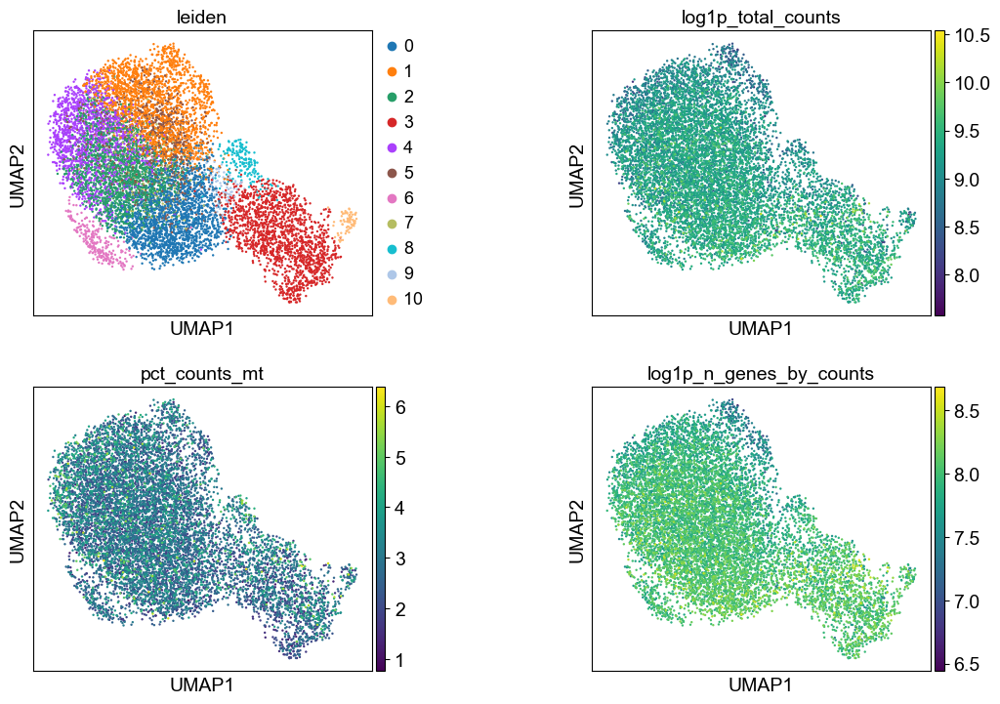

In [20]:
sc.pl.umap(
    adata,
    color=["leiden", "log1p_total_counts", "pct_counts_mt", "log1p_n_genes_by_counts"],
    wspace=0.5,
    ncols=2,
)

## Annotation

### Optimising Clustering
different resolutions

In [21]:
# Test different resolutions for Leiden clustering
# Higher resolution will result in more clusters, lower resolution will result in fewer clusters
for res in [0.02, 0.5, 1.0, 2.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph"
    )

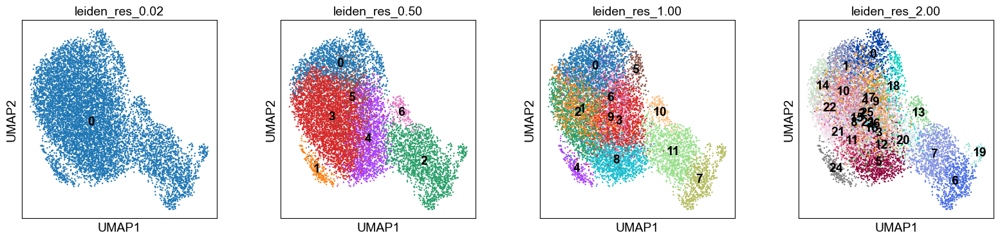

In [22]:
sc.pl.umap(
    adata,
    color=["leiden_res_0.02", "leiden_res_0.50", "leiden_res_1.00", "leiden_res_2.00"],
    legend_loc="on data",
)

Plot known marker genes to see if they align with your clusters
Cluster sizes

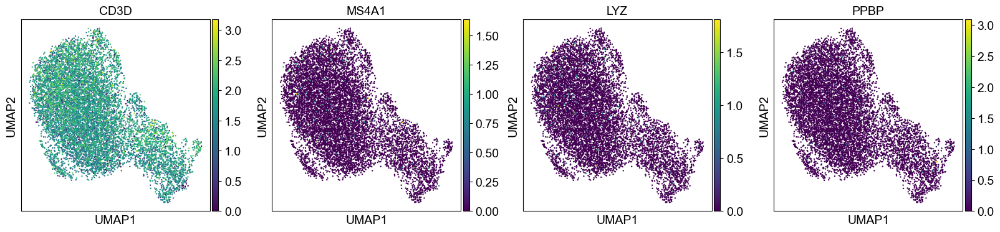

leiden
0     1887
1     1870
2     1707
3     1563
4     1461
5      728
6      262
7      222
8      185
9       98
10      76
Name: count, dtype: int64

In [23]:
sc.pl.umap(adata, color=["CD3D", "MS4A1", "LYZ", "PPBP"])  # example for T-cells, B-cells, monocytes, platelets
adata.obs["leiden"].value_counts()      # Check cluster sizes




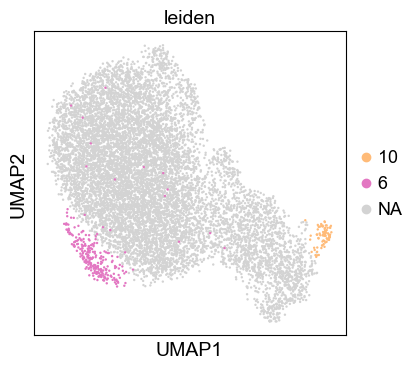

In [24]:
sc.pl.umap(adata, color='leiden', groups=['6', '10'])


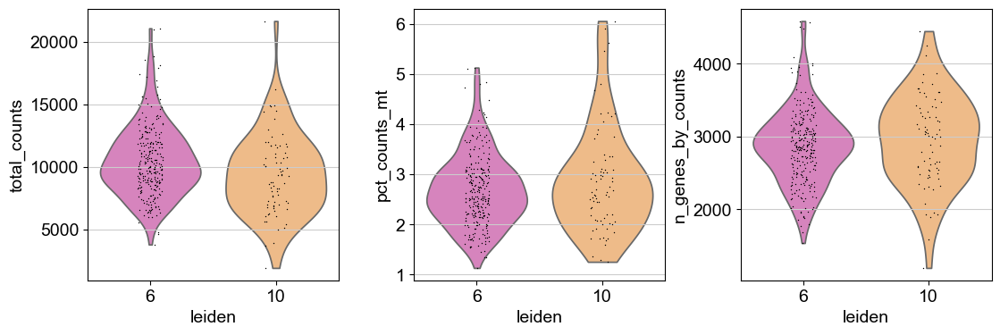

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt

adata_sub = adata[adata.obs['leiden'].isin(['6', '10'])].copy()

# Violin plots for total counts, mito%, n_genes for clusters 6 and 10
sc.pl.violin(adata_sub, ['total_counts', 'pct_counts_mt', 'n_genes_by_counts'],
             groupby='leiden', multi_panel=True)

saving figure to file figures/rank_genes_groups_leidenbatch1_leiden_6_10_rank_genes.png


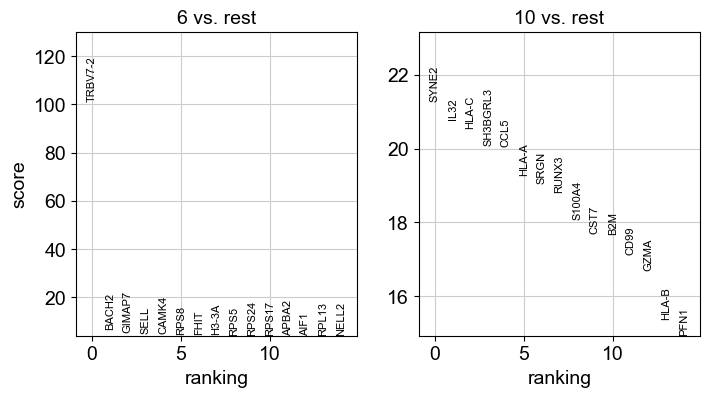

In [26]:
sc.tl.rank_genes_groups(adata, groupby='leiden', groups=['6', '10'], method='t-test')
sc.pl.rank_genes_groups(adata, groups=['6', '10'], n_genes=15, sharey=False, save='batch1_leiden_6_10_rank_genes.png')


## Marker gene list

In [ ]:
tcell_markers = {
    "Tfh": ["CXCR5", "PDCD1", "BCL6", "ICOS", "IL21"],
    "Naive_CD4": ["CCR7", "SELL", "LEF1", "TCF7"],
    "TCM": ["CCR7", "IL7R", "SELL"],
    "TEM": ["GZMK", "PRF1", "GNLY"],
    "Th1": ["TBX21", "IFNG", "CXCR3"],
    "Th2": ["GATA3", "IL4", "IL5", "IL13"],
    "Th17": ["RORC", "IL17A", "IL17F", "CCR6"],
    "Treg": ["FOXP3", "IL2RA", "CTLA4", "IKZF2"],
    "Naive_CD8": ["CCR7", "SELL", "LEF1", "TCF7", "CD8A", "CD8B"],
    "TCM_CD8": ["CCR7", "IL7R", "SELL", "CD8A", "CD8B"],
    "TEM_CD8": ["GZMK", "PRF1", "GNLY", "CD8A", "CD8B"],
    "Cytotoxic_CD8": ["GZMB", "PRF1", "GNLY", "NKG7", "CD8A", "CD8B"],
    "Exhausted_CD8": ["PDCD1", "LAG3", "HAVCR2", "TIGIT", "CD8A", "CD8B"]
}

tfh_genes = {
    "tfh_pos": [
        "CXCR5",
        "PDCD1",      # PD-1
        "ICOS",
        "BCL6",
        "IL21",
        "TOX2",
        "MAF",
        "CXCL13",
        "SH2D1A",     # SAP
        "BATF",
        "TNFRSF4",    # OX40
    ],
    "tfh_neg": [
        "TBX21",      # Th1
        "IFNG",       # Th1 cytokine
        "GATA3",      # Th2
        "IL4",        # Th2 cytokine
        "RORC",       # Th17
        "IL17A",      # Th17 cytokine
        "FOXP3",      # Treg
        "CTLA4",      # Treg
    ]
}

saving figure to file figures/dotplot_batch1_tcell_dotplot.png


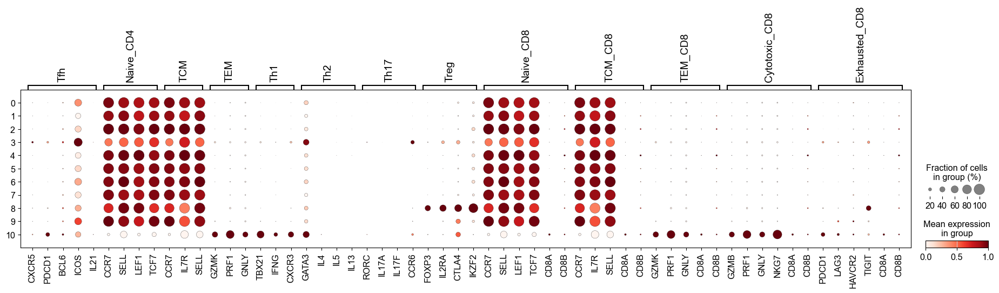

saving figure to file figures/dotplot_batch1_tfh_genes_dotplot.png


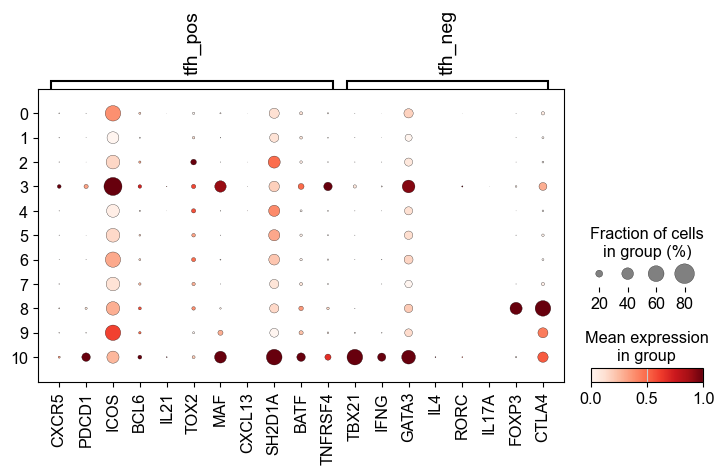

In [71]:
sc.pl.dotplot(adata, tcell_markers, groupby="leiden", standard_scale="var", save='batch1_tcell_dotplot.png')
sc.pl.dotplot(adata, tfh_genes, groupby="leiden", standard_scale="var", save='batch1_tfh_genes_dotplot.png')


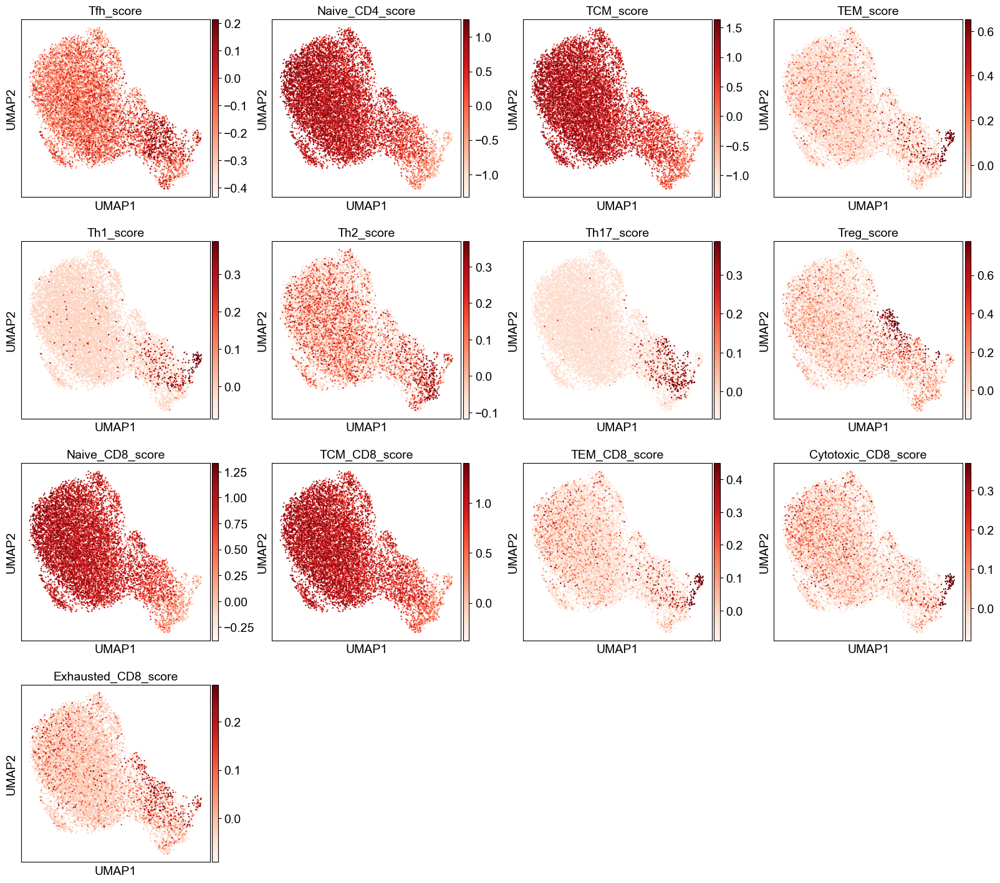

In [68]:
for subset, genes in tcell_markers.items():
    sc.tl.score_genes(adata, gene_list=genes, score_name=f"{subset}_score")

sc.pl.umap(adata, color=[f"{subset}_score" for subset in tcell_markers.keys()],
           cmap='Reds', vmax='p99', ncols=4)


saving figure to file figures/umapbatch1_pos_tfh_markers_umap.png


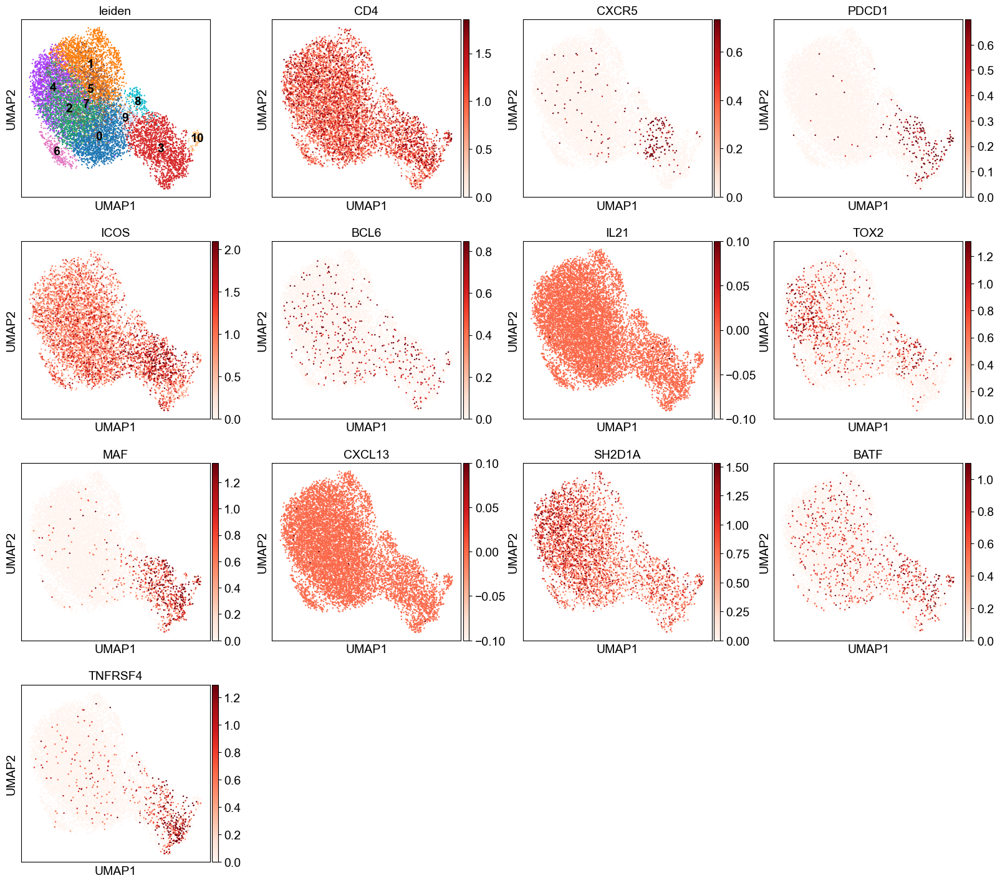

saving figure to file figures/umapbatch1_neg_tfh_markers_umap.png


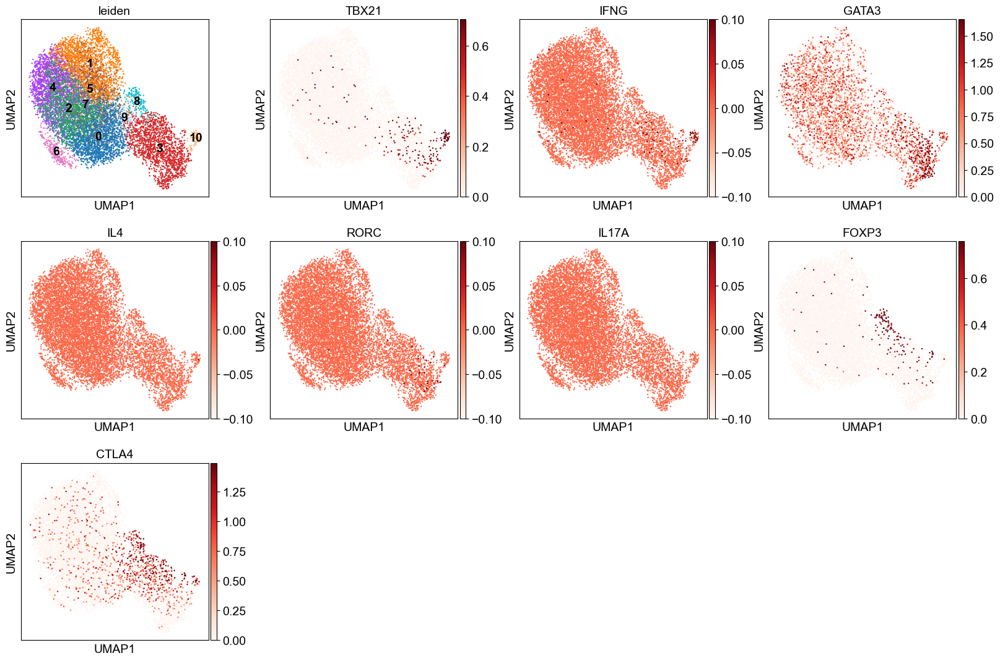

In [73]:


sc.pl.umap(adata, color=['leiden', 'CD4', 'CXCR5', 'PDCD1', 'ICOS', 'BCL6', 'IL21', 'TOX2', 'MAF', 'CXCL13', 'SH2D1A', 'BATF', 'TNFRSF4'], 
           legend_loc= 'on data', 
           cmap= 'Reds',
           vmax = 'p99', 
           save='batch1_pos_tfh_markers_umap.png')

sc.pl.umap(adata, color=['leiden', 'TBX21', 'IFNG', 'GATA3', 'IL4', 'RORC', 'IL17A', 'FOXP3', 'CTLA4'],
           legend_loc= 'on data', 
           cmap= 'Reds', 
           vmax = 'p99', 
           save='batch1_neg_tfh_markers_umap.png')


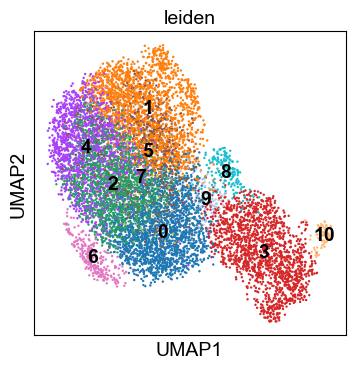

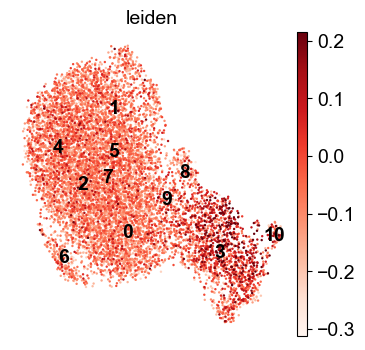

In [55]:

sc.tl.score_genes(adata, tfh_genes["tfh_pos"], score_name="TFH_score")

sc.pl.umap(
    adata,
    color=['leiden'],
    legend_loc='on data',
    cmap='Reds', vmax='p99'
)

ax = sc.pl.umap(
    adata, color='TFH_score',
    cmap='Reds', vmax='p99',
    frameon=False, show=False
)
# draw the same embedding again, but only to place cluster labels
sc.pl.umap(
    adata, color='leiden',
    legend_loc='on data',  # writes the cluster numbers on the cloud
    size=1.5, alpha=0.0,   # don't add extra points; just labels
    ax=ax, show=False
)
plt.show()

            mean    median  size
leiden                          
10      0.000188 -0.020921    76
3      -0.004042 -0.019038  1563
9      -0.074450 -0.084049    98
8      -0.093401 -0.109207   185
2      -0.097472 -0.102677  1707
1      -0.100852 -0.106512  1870
5      -0.109459 -0.113226   728
6      -0.109707 -0.115655   262
0      -0.110012 -0.112724  1887
4      -0.113539 -0.119295  1461
7      -0.114005 -0.111499   222


/var/folders/xb/gpl6jzb15493fwndpjblxyc40000gn/T/ipykernel_95119/2969961483.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby('leiden')['TFH_score']


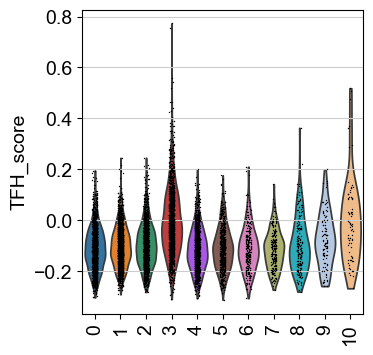

In [39]:
# mean/median TFH_score per Leiden cluster
summary = (
    adata.obs.groupby('leiden')['TFH_score']
    .agg(['mean','median','size'])
    .sort_values('mean', ascending=False)
)
print(summary)

# violin to see TFH_score distribution per cluster
sc.pl.violin(adata, keys='TFH_score', groupby='leiden', rotation=90)

In [32]:
cluster_annotations = {
    '0': 'Naive CD4+ T',
    '1': 'Th1',                
    '2': 'Central Memory',
    '3': 'Tfh',                
    '4': 'Activated T',
    '5': 'Transitional Tfh',
    '6': 'Th2/ILC-like',
    '7': 'Naive/Quiescent',
    '8': 'Th17',
    '9': 'Uncertain',
    '10': 'Treg',
}
adata.obs['celltype'] = adata.obs['leiden'].map(cluster_annotations)


saving figure to file figures/umapbatch1_tfh_annotations_umap.png


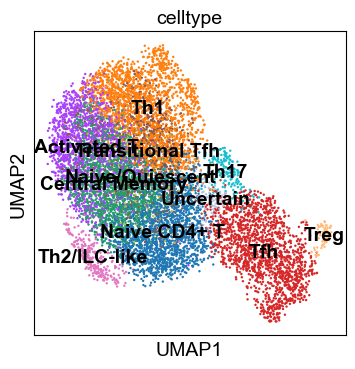

In [33]:
sc.pl.umap(adata, color='celltype', legend_loc='on data', save='batch1_tfh_annotations_umap.png')


## DEGs as Markers

saving figure to file figures/rank_genes_groups_leidenbatch1_leiden_rank_genes.png


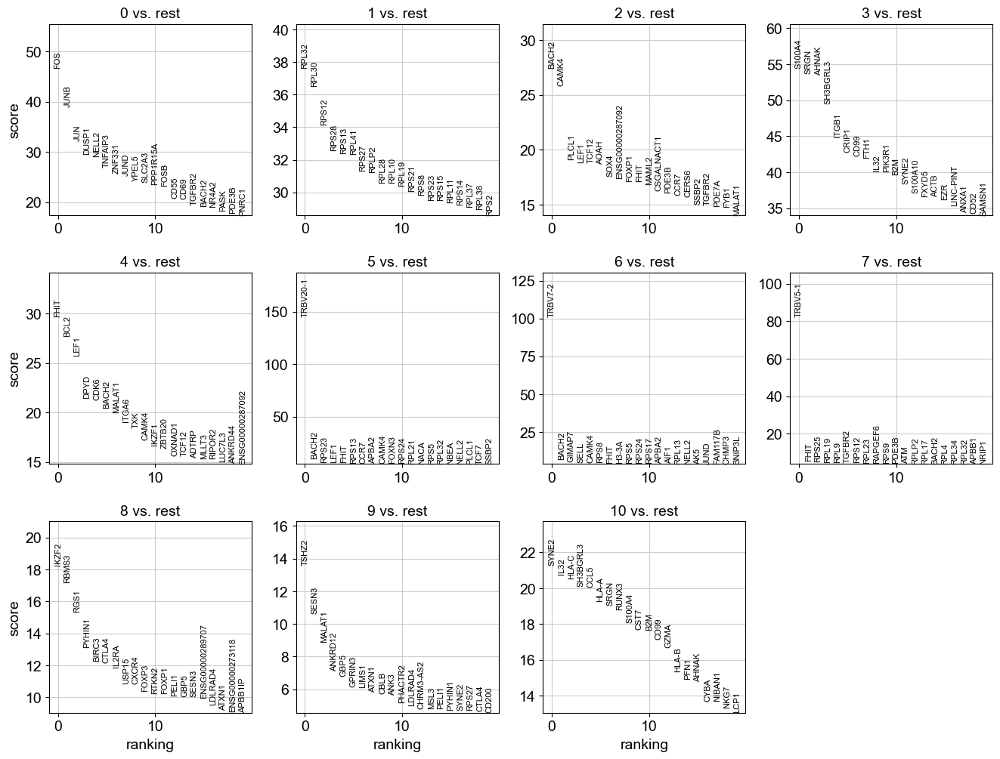

In [34]:
sc.tl.rank_genes_groups(adata, groupby='leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False, save='batch1_leiden_rank_genes.png')


saving figure to file figures/rank_genes_groups_leidenleiden_rank_genes_batch1_0_1.png


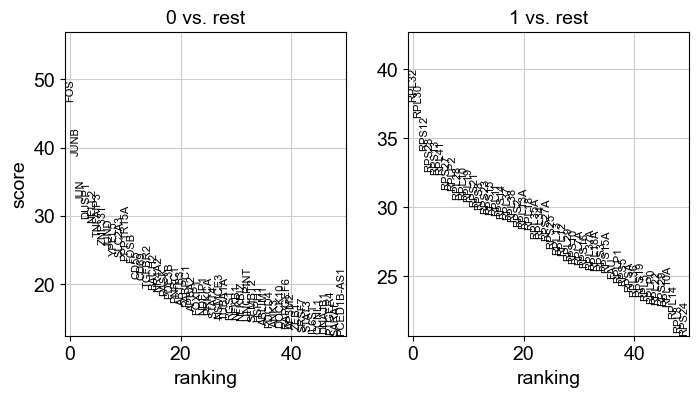

In [35]:
sc.pl.rank_genes_groups(adata, n_genes=50, sharey=False, groups=['0','1'], save='leiden_rank_genes_batch1_0_1.png')

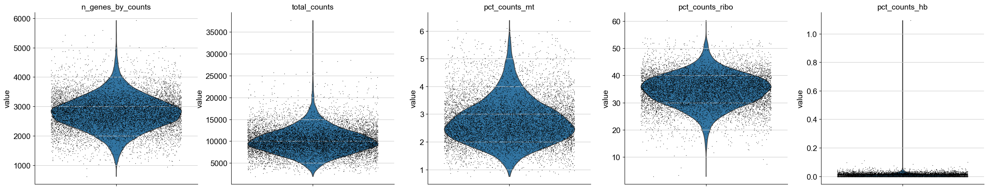

In [36]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', 'pct_counts_hb'], jitter=0.4, multi_panel=True)

In [37]:
sc.pl.dotplot(adata, marker_genes, groupby="leiden_res_1.0", standard_scale="var")

NameError: name 'marker_genes' is not defined